# Reproduce Inception circuit

## Code setup

In [1]:
import json
import pickle

import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as functional
from PIL import Image
from torchvision import transforms
from tqdm import tqdm
import matplotlib.pyplot as plt

from dawnet.data.image import show_images

In [2]:
def load_model():
    model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
    model.eval().cuda()
    return model

model = load_model()

Using cache found in /home/john/.cache/torch/hub/pytorch_vision_v0.10.0
/home/john/miniconda3/envs/tlens/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/john/miniconda3/envs/tlens/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
# Load images
from pathlib import Path

PATH = "/data/datasets/imagenet/object_localization/temp"
image_paths = list(sorted(Path(PATH).glob("n*/*.*")))
print(f"There are {len(image_paths)} images")

# Load labels
with open("label_to_idx.json", "r") as fi:
    LABEL_TO_IDX = json.load(fi)

with open("imagenet_classes.txt", "r") as f:
    IDX_TO_READABLE = [s.strip() for s in f.readlines()]

def get_idx_from_filepath(image_path):
    return LABEL_TO_IDX[Path(image_path).parent.name]

def get_readable_from_filepath(image_path):
    return IDX_TO_READABLE[LABEL_TO_IDX[Path(image_path).parent.name]]

# imagenet image processor
preprocess = transforms.Compose([
    transforms.Resize(299),
    transforms.CenterCrop(299),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

There are 50000 images


In [4]:
def show_image(image_path):
    Image.open(image_path).show()


def pred(image_paths):
    input_tensors = []
    for image_path in image_paths:
        input_image = Image.open(image_path).convert("RGB")
        input_tensor = input_tensors.append(preprocess(input_image))
    input_batch = torch.stack(input_tensors, dim=0) # create a mini-batch as expected by the model
    # move the input and model to GPU for speed if available
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')
    
    with torch.no_grad():
        output = model(input_batch)

    return output


def print_top5(probabilities):
    # Show top categories per image
    top5_prob, top5_catid = torch.topk(probabilities, 5)
    for i in range(top5_prob.size(0)):
        for j in range(top5_prob.size(1)):
            print(IDX_TO_READABLE[top5_catid[i][j]], top5_prob[i][j].item())
        print()

In [5]:
import ipywidgets as widgets

def _button_reload_model(b):
    global model
    model = load_model
    print("Model Reloaded")


button = widgets.Button(
    description='Reload model',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Reoload model',
    icon='rocket' # (FontAwesome names without the `fa-` prefix)
)
button.on_click(_button_reload_model)
button

Button(description='Reload model', icon='rocket', style=ButtonStyle(), tooltip='Reoload model')

In [5]:
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

## Begin experiment

In [6]:
batch_size = 256
for idx in tqdm(range(0, len(image_paths), batch_size)):
    pred(image_paths[idx:idx+batch_size])

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.74s/it]


In [8]:
keys, values = list(important_values.keys()), list(important_values.values())
arr = np.array(values)

NameError: name 'important_values' is not defined

In [5]:
print(arr.max(), arr.min())
print(
    np.quantile(arr, 0.1),
    np.quantile(arr, 0.25),
    np.quantile(arr, 0.5),
    np.quantile(arr, 0.75),
    np.quantile(arr, 0.90)
)

high = [idx for idx, each in enumerate(values) if each > 4]

NameError: name 'arr' is not defined

In [8]:
pictures = [keys[each] for each in high]

In [7]:
model_keys = list(model._modules.keys())

In [8]:
print(model_keys)

['Conv2d_1a_3x3', 'Conv2d_2a_3x3', 'Conv2d_2b_3x3', 'maxpool1', 'Conv2d_3b_1x1', 'Conv2d_4a_3x3', 'maxpool2', 'Mixed_5b', 'Mixed_5c', 'Mixed_5d', 'Mixed_6a', 'Mixed_6b', 'Mixed_6c', 'Mixed_6d', 'Mixed_6e', 'AuxLogits', 'Mixed_7a', 'Mixed_7b', 'Mixed_7c', 'avgpool', 'dropout', 'fc']


In [10]:
abc[1][0]

'Conv2d_1a_3x3'

In [10]:
# get the classes that don't show up
showing_up = set([each.parent.name for each in pictures])
not_showing_up = set(LABEL_TO_IDX.keys()).difference(showing_up)
print(not_showing_up)

{'n02086240', 'n04209239', 'n04344873', 'n04347754', 'n02486410', 'n02134084', 'n02106030', 'n02105162', 'n03743016', 'n09472597', 'n03478589', 'n03016953', 'n02111889', 'n02093991', 'n02120079', 'n02443114', 'n02093859', 'n03673027', 'n04562935', 'n09421951', 'n02514041', 'n01665541', 'n01817953', 'n03207743', 'n02422106', 'n02488291', 'n02074367', 'n02486261', 'n04004767', 'n01873310', 'n01910747', 'n03788365'}


In [11]:
for each in list(not_showing_up):
    print(IDX_TO_READABLE[LABEL_TO_IDX[each]])

Shih-Tzu
shower curtain
studio couch
submarine
baboon
ice bear
collie
malinois
megalith
volcano
half track
chiffonier
Samoyed
Irish terrier
Arctic fox
polecat
Kerry blue terrier
liner
water tower
sandbar
barracouta
leatherback turtle
African grey
dishrag
hartebeest
langur
dugong
patas
printer
platypus
jellyfish
mosquito net


In [26]:
idx = -2

Image.open(pictures[idx]).show()
get_readable_from_filepath(pictures[idx])

'toilet tissue'

In [30]:
cls = [each.parent.name for each in pictures]
print(len(set(cls)))

968


In [ ]:
# image_path = image_paths[43534]
# image_path = "/home/john/Downloads/xyz.jpg"
print_top5(pred(image_paths[0:16]))
# show_image(image_path)

## Get collection of images that best activate a neuron

We can also get collection of images that best inhibit a neuron.

The result is similar to: https://microscope.openai.com/models/inceptionv3_slim/InceptionV3_InceptionV3_Mixed_7a_concat_0?models.op.feature_vis.type=channel&models.op.technique=feature_vis

In [8]:
# neuron identity
# list of outputs
records = {}

class Record(nn.Module):
    def __init__(self, module, name):
        super().__init__()
        self.m = module
        self.n = name

    def forward(self, x):
        if self.n not in records:
            records[self.n] = []
        x = self.m(x)
        max_vals = x.view(x.shape[0], x.shape[1], -1).max(dim=2).values
        records[self.n].append(max_vals.cpu().numpy())
        return x


names = list(model._modules.keys())
for name in names:
    # change the modules
    module = Record(model._modules[name], name)
    model._modules[name] = module

In [9]:
print(len(records))

0


In [10]:
batch_size = 256
for idx in tqdm(range(0, len(image_paths), batch_size)):
    pred(image_paths[idx:idx+batch_size])

100%|█████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


In [12]:
names = list(records.keys())

In [11]:
records["Mixed_7a"][0].shape

(256, 1280)

In [12]:
records["Conv2d_1a_3x3"][0].shape

(256, 32)

In [6]:
clean_labels = []
for image_path in image_paths:
    clean_labels.append(get_idx_from_filepath(image_path))

In [7]:
with open("max.pkl", "rb") as fi:
    records = pickle.load(fi)["records"]

In [ ]:
for idx in range(2048):
    print(idx, np.argpartition(-records["Mixed_7c"][:,idx], 10)[:10])

In [ ]:
for idx in range(2048):
    print(idx, [clean_labels[_] for _ in np.argpartition(-records["Mixed_7c"][:,idx], 10)[:10]])

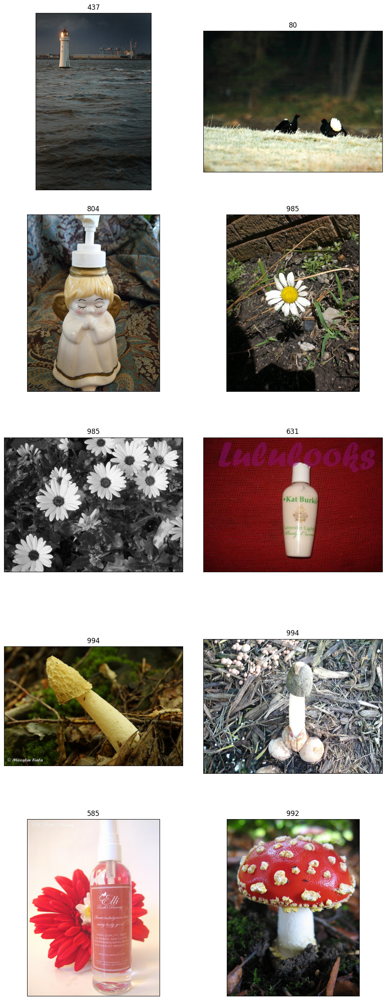

In [8]:
items = np.argpartition(-records["Mixed_7a"][:,42], 10)[:10]
images = [cv2.cvtColor(cv2.imread(str(image_paths[each])), cv2.COLOR_BGR2RGB) for each in items]

show_images(images, label_list=[clean_labels[_] for _ in items], max_columns=2)

In [14]:
image_paths[items[0]]

PosixPath('/data/datasets/imagenet/object_localization/temp/n03196217/ILSVRC2012_val_00003643.JPEG')

In [59]:
cv2.imread(str(image_paths[694])).shape

(500, 400, 3)

## Feature visualization

SGD with momentum greatly improves the optimization time than SGD without momentum. Also, with momentum (e.g. 0.9, 0.99...), the optimized images tend to have less checker-board patterns (maybe because momentum helps reduce the amount of high frequency signals).

### Channel optimization

In [8]:
_temp = cv2.imread("./assets/channel-21.png", cv2.IMREAD_COLOR)
_temp = cv2.cvtColor(_temp, cv2.COLOR_BGR2RGB)

_temp_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
_temp_out = model(_temp_transform(_temp).unsqueeze(0).cuda())
print(_temp_out)

tensor([[-1488.8472]], device='cuda:0', grad_fn=<NegBackward0>)


In [9]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval().cuda()

class Identity(nn.Module):
    def forward(self, x):
        return x

class SumChannelWise(nn.Module):
    def __init__(self, layer_idx):
        super().__init__()
        self.layer_idx = layer_idx

    def forward(self, x):
        xyz = -x[:, self.layer_idx, :, :].view(x.shape[0], -1).sum(dim=1).unsqueeze(-1)
        return xyz

model.Mixed_7b = SumChannelWise(46)
model.Mixed_7c = Identity()
model.avgpool = Identity()
model.dropout = Identity()
model.fc = Identity()

Using cache found in /home/john/.cache/torch/hub/pytorch_vision_v0.10.0


0 -1.6386967897415161
500 -3261.5244140625
1000 -3954.254638671875
1500 -4507.4365234375
2000 -5014.115234375
2500 -4696.5400390625
3000 -4824.00927734375
3500 -5340.5166015625
4000 -5110.9638671875
4500 -5167.03955078125
5000 -5355.2294921875
5500 -5336.4716796875
6000 -5206.79052734375
6500 -5463.0751953125
7000 -5482.6767578125
7500 -5376.8876953125
8000 -5584.93359375
8500 -5467.6728515625
9000 -5786.09912109375
9500 -5563.84375
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


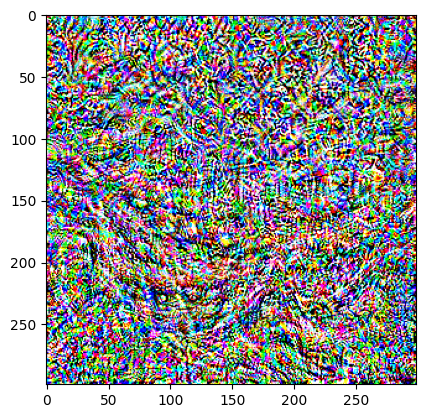

In [41]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

0 -0.06503532826900482
500 -824.579833984375
1000 -1405.37939453125
1500 -1752.424560546875
2000 -1911.3060302734375
2500 -2032.44482421875
3000 -2069.435302734375
3500 -2177.4833984375
4000 -2250.90576171875
4500 -2314.1142578125
5000 -2329.77099609375
5500 -2394.76513671875
6000 -2451.36572265625
6500 -2480.6328125
7000 -2576.28857421875
7500 -2562.4150390625
8000 -2632.84228515625
8500 -2655.156005859375
9000 -2714.963134765625
9500 -2734.484375
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


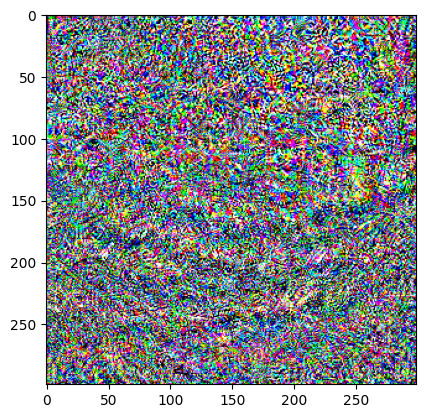

In [42]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, weight_decay=1e-5)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

0 -0.24721528589725494
500 -2862.565185546875
1000 -3529.4248046875
1500 -3958.735107421875
2000 -4519.3046875
2500 -4569.6787109375
3000 -4603.5966796875
3500 -5226.6943359375
4000 -4749.619140625
4500 -4630.4208984375
5000 -5017.9033203125
5500 -5334.6337890625
6000 -5439.1943359375
6500 -5070.48046875
7000 -5218.9794921875
7500 -5394.70654296875
8000 -4889.0009765625
8500 -5001.6513671875
9000 -5355.279296875
9500 -5303.2236328125
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


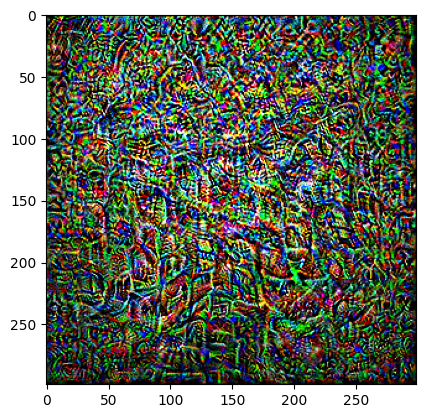

In [44]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-1)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

0 -0.5496596097946167
500 -1430.263916015625
1000 -1403.8406982421875
1500 -1631.29345703125
2000 -1761.9923095703125
2500 -1629.845458984375
3000 -1854.273193359375
3500 -1871.357421875
4000 -1861.052734375
4500 -1904.38037109375
5000 -1902.47998046875
5500 -1928.8409423828125
6000 -1734.569580078125
6500 -1821.564697265625
7000 -1975.177978515625
7500 -1964.6939697265625
8000 -2016.5491943359375
8500 -2232.31640625
9000 -2065.29736328125
9500 -1959.36279296875
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


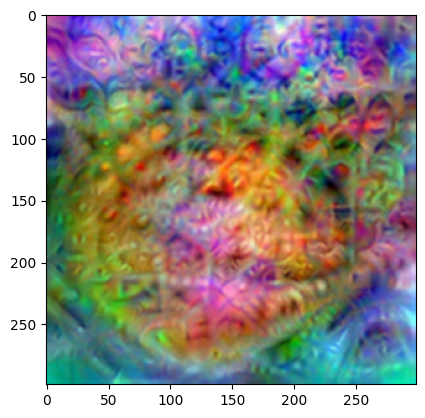

In [48]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (3, 3), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

0 -222.9891357421875
500 -7000.72705078125
1000 -7545.81884765625
1500 -7633.9296875
2000 -7192.8857421875
2500 -7805.921875
3000 -8039.85302734375
3500 -7879.1669921875
4000 -8870.880859375
4500 -7389.380859375
5000 -8901.591796875
5500 -7907.8916015625
6000 -8249.666015625
6500 -8744.9150390625
7000 -8516.3017578125
7500 -8875.1552734375
8000 -9461.66015625
8500 -9008.95703125
9000 -8962.076171875
9500 -9281.3623046875
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


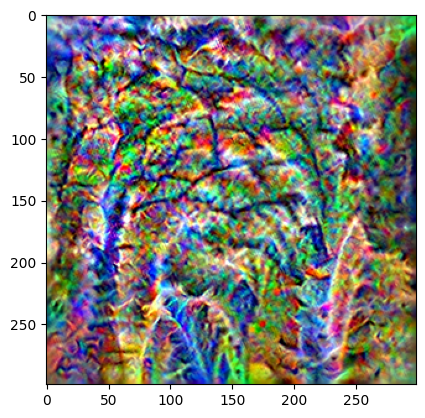

In [7]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-2)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (3, 3), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow((before_blur * 255).astype(np.uint8))

Using cache found in /home/john/.cache/torch/hub/pytorch_vision_v0.10.0


0 -556.6494140625
500 -4677.6669921875
1000 -4963.19580078125
1500 -5177.98193359375
2000 -5040.2529296875
2500 -5029.81396484375
3000 -4977.5341796875
3500 -5330.3134765625
4000 -5399.9375
4500 -5239.2353515625
5000 -5274.474609375
5500 -5239.830078125
6000 -5511.4521484375
6500 -5431.12841796875
7000 -5455.90234375
7500 -5641.177734375
8000 -5407.236328125
8500 -4968.89453125
9000 -5546.142578125
9500 -5386.0302734375
tensor(0., device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


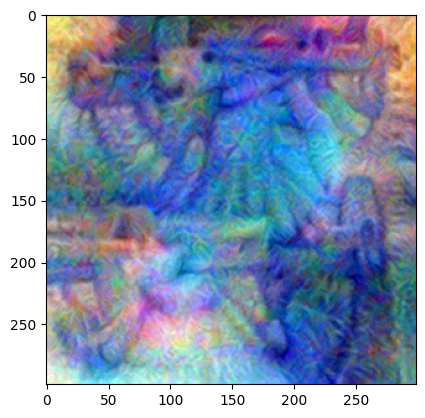

In [8]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval().cuda()

class Identity(nn.Module):
    def forward(self, x):
        return x

class SumChannelWise(nn.Module):
    def __init__(self, layer_idx):
        super().__init__()
        self.layer_idx = layer_idx

    def forward(self, x):
        xyz = -x[:, self.layer_idx, :, :].view(x.shape[0], -1).sum(dim=1).unsqueeze(-1)
        return xyz

model.Mixed_7b = SumChannelWise(46)
model.Mixed_7c = Identity()
model.avgpool = Identity()
model.dropout = Identity()
model.fc = Identity()

progress = []

norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.Adam([opt_image], lr=0.05, betas=(0.5, 0.5), weight_decay=1e-3)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
        if before_blur is not None:
            progress.append(before_blur)
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (3, 3), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.Adam([opt_image], lr=0.01, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow((before_blur * 255).astype(np.uint8))

Using cache found in /home/john/.cache/torch/hub/pytorch_vision_v0.10.0


0 -657.9898681640625
500 -2865.049560546875
1000 -2897.557373046875
1500 -3000.513671875
2000 -3019.567626953125
2500 -3061.76806640625
3000 -3009.14794921875
3500 -3113.271484375
4000 -2537.684814453125
4500 -3571.8154296875
5000 -3571.5478515625
5500 -3171.7646484375
6000 -3132.15234375
6500 -3214.081787109375
7000 -3414.498779296875
7500 -3462.00146484375
8000 -3825.301025390625
8500 -3510.60546875
9000 -3987.65576171875
9500 -3415.71533203125
tensor(0.0054, device='cuda:0', grad_fn=<MinBackward1>) tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)


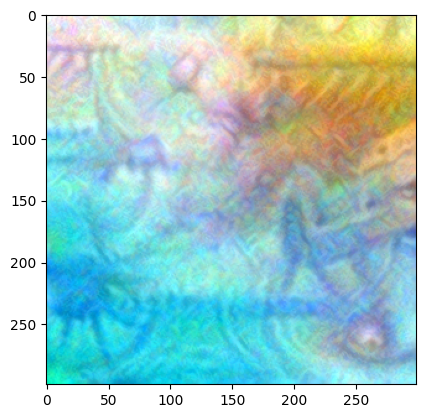

In [32]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval().cuda()

class Identity(nn.Module):
    def forward(self, x):
        return x

class SumChannelWise(nn.Module):
    def __init__(self, layer_idx):
        super().__init__()
        self.layer_idx = layer_idx

    def forward(self, x):
        xyz = -x[:, self.layer_idx, :, :].view(x.shape[0], -1).sum(dim=1).unsqueeze(-1)
        return xyz

model.Mixed_7b = SumChannelWise(46)
model.Mixed_7c = Identity()
model.avgpool = Identity()
model.dropout = Identity()
model.fc = Identity()

progress = []

# norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = torch.rand(1, 3, 299, 299).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.Adam([opt_image], lr=0.05, betas=(0.5, 0.5), weight_decay=1e-3)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
        if before_blur is not None:
            progress.append(before_blur)
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (5, 5), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.Adam([opt_image], lr=0.01, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow((before_blur * 255).astype(np.uint8))

In [27]:
before_blur2 = before_blur.transpose(2, 0, 1)
print(before_blur2.shape)
before_blur3 = before_blur2 * np.array([[[0.229]], [[0.224]], [[0.225]]]) + np.array([[[0.485]], [[0.456]], [[0.406]]])
print(before_blur3.shape)
before_blur4 = before_blur3.transpose(1, 2, 0)

(3, 299, 299)
(3, 299, 299)


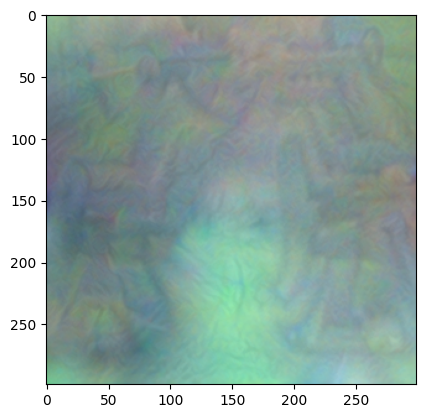

In [29]:
plt.imshow((before_blur4 * 255).astype(np.uint8))

In [17]:
before_blur2 = before_blur.transpose(2, 0, 1)
print(before_blur2.shape)
before_blur3 = before_blur2 * np.array([[[0.229]], [[0.224]], [[0.225]]]) + np.array([[[0.485]], [[0.456]], [[0.406]]])
print(before_blur3.shape)
before_blur4 = before_blur3.transpose(1, 2, 0)

(3, 299, 299)
(3, 299, 299)


In [21]:
before_blur2[0][0][10], before_blur3[0][0][10]

(0.9631859, 0.7055695725679397)

In [22]:
0.9631 * 0.229 + 0.485

0.7055499

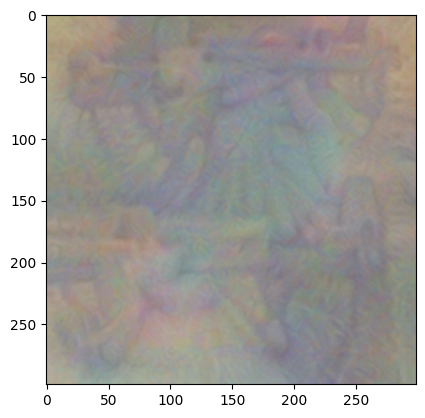

In [18]:
plt.imshow((before_blur4 * 255).astype(np.uint8))

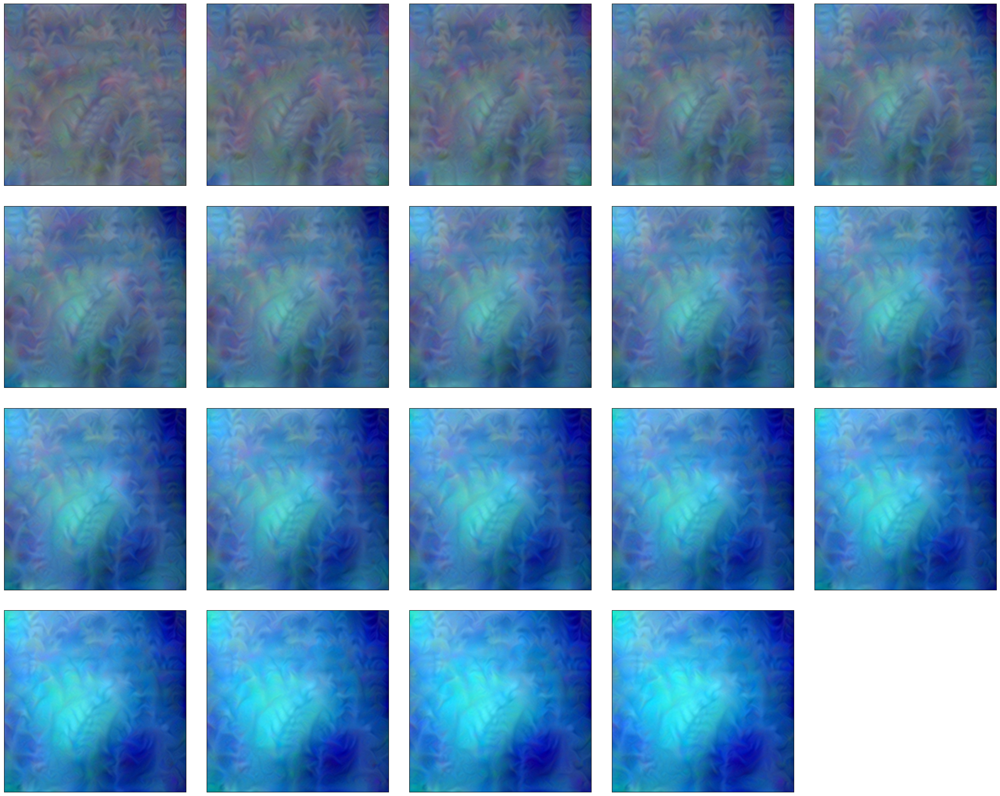

In [21]:
show_images(progress, max_columns=5)

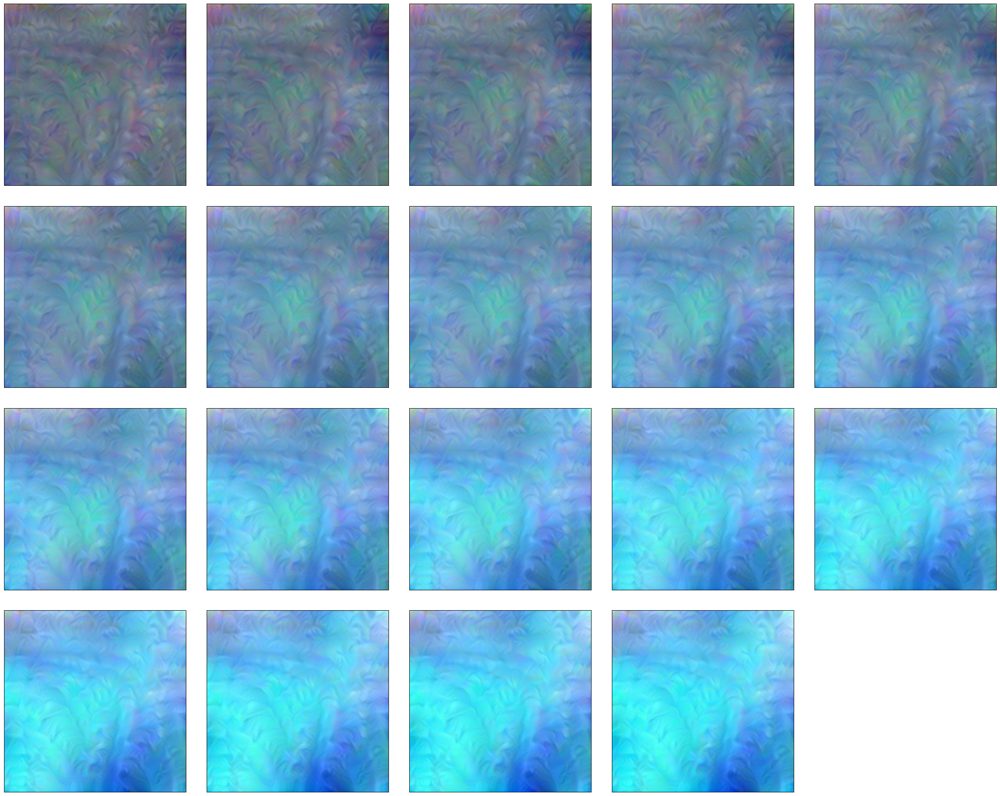

In [19]:
show_images(progress, max_columns=5)

0 -0.810900092124939
100 -660.7985229492188
200 -993.6072998046875
300 -906.58251953125
400 -1087.21728515625
500 -1102.011474609375
600 -1154.7490234375
700 -1117.75390625
800 -1216.3897705078125
900 -1244.038330078125
1000 -1181.7154541015625
1100 -1274.6903076171875
1200 -1251.7161865234375
1300 -1255.086181640625
1400 -1272.65576171875
1500 -1295.880859375
1600 -1236.801513671875
1700 -1230.0135498046875
1800 -1349.73681640625
1900 -1266.153076171875
2000 -1300.74853515625
2100 -1323.6669921875
2200 -1327.281982421875
2300 -1358.765625
2400 -1217.60205078125
2500 -1252.55712890625
2600 -1229.0477294921875
2700 -1308.3349609375
2800 -1343.41748046875
2900 -1263.4342041015625
3000 -1300.94873046875
3100 -1290.020263671875
3200 -1303.3779296875
3300 -1267.8228759765625
3400 -1262.5
3500 -1228.52294921875
3600 -1349.3798828125
3700 -1344.45654296875
3800 -1312.962646484375
3900 -1350.8792724609375
4000 -1300.12646484375
4100 -1315.174560546875
4200 -1259.851806640625
4300 -1411.1280517

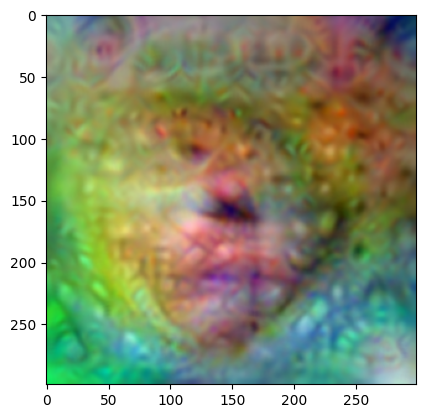

In [16]:
input_image = Image.open("/data/datasets/imagenet/object_localization/temp/n03196217/ILSVRC2012_val_00003643.JPEG").convert("RGB")
input_tensor = preprocess(input_image)
input_tensor = input_tensor.unsqueeze(0).cuda()
input_tensor.requires_grad_()

norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 100 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (5, 5), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

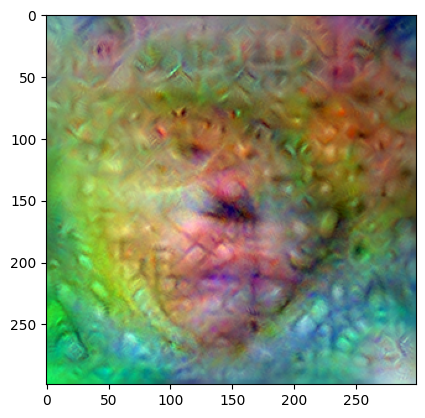

In [17]:
plt.imshow((before_blur * 255).astype(np.uint8))

0 -0.0
100 -608.9351806640625
200 -754.3726806640625
300 -793.3308715820312
400 -866.499267578125
500 -902.2659912109375
600 -949.5841674804688
700 -973.093505859375
800 -924.9505004882812
900 -1054.3165283203125
1000 -1141.864013671875
1100 -1135.627685546875
1200 -1172.720703125
1300 -1143.567138671875
1400 -1174.1279296875
1500 -1188.115966796875
1600 -1233.001953125
1700 -1251.830078125
1800 -1209.785400390625
1900 -1186.7945556640625
2000 -1277.299072265625
2100 -1256.2484130859375
2200 -1320.9815673828125
2300 -1272.5506591796875
2400 -1292.78857421875
2500 -1277.836181640625
2600 -1278.38916015625
2700 -1281.64697265625
2800 -1373.1190185546875
2900 -1126.975341796875
3000 -1251.68603515625
3100 -1339.03369140625
3200 -1304.0670166015625
3300 -1149.022216796875
3400 -1314.60302734375
3500 -1318.6968994140625
3600 -1290.8363037109375
3700 -1271.5386962890625
3800 -1288.728271484375
3900 -1274.49267578125
4000 -1289.527587890625
4100 -1371.5894775390625
4200 -1262.2010498046875
43

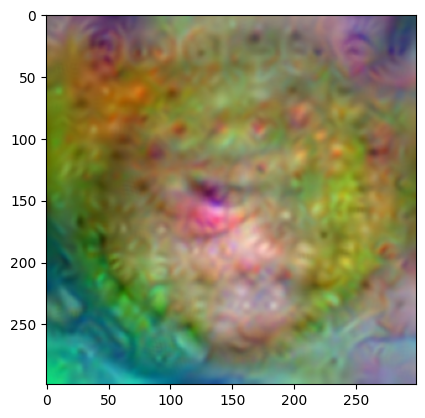

In [6]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (5, 5), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

Using cache found in /home/john/.cache/torch/hub/pytorch_vision_v0.10.0


0 -3.276843547821045
500 -1494.43017578125
1000 -1561.718017578125
1500 -1600.7615966796875
2000 -1642.12939453125
2500 -1707.744873046875
3000 -1680.825927734375
3500 -1804.3570556640625
4000 -1855.4501953125
4500 -1755.946044921875
5000 -1782.433837890625
5500 -1699.3701171875
6000 -1816.5546875
6500 -1772.9072265625
7000 -1865.546142578125
7500 -1797.037841796875
8000 -1882.885986328125
8500 -1925.3424072265625
9000 -1904.385009765625
9500 -1958.330322265625
tensor(0.0069, device='cuda:0', grad_fn=<MinBackward1>) tensor(0.7988, device='cuda:0', grad_fn=<MaxBackward1>)


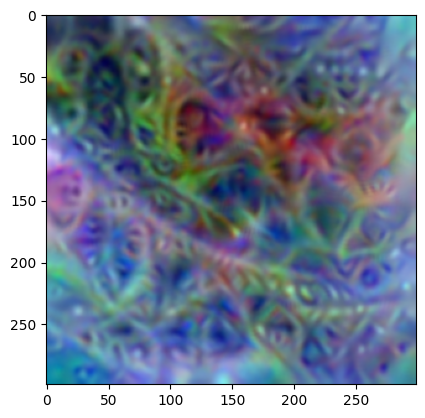

In [37]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval().cuda()

class Identity(nn.Module):
    def forward(self, x):
        return x

class SumChannelWise(nn.Module):
    def __init__(self, layer_idx):
        super().__init__()
        self.layer_idx = layer_idx

    def forward(self, x):
        xyz = -x[:, self.layer_idx, :, :].view(x.shape[0], -1).sum(dim=1).unsqueeze(-1)
        return xyz

model.Mixed_7b = SumChannelWise(34)
model.Mixed_7c = Identity()
model.avgpool = Identity()
model.dropout = Identity()
model.fc = Identity()

norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
opt_image = norm(torch.rand(1, 3, 299, 299)).cuda()
opt_image.requires_grad_()

before_blur = None
import torch.optim as optim
optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
optimizer.zero_grad()

for idx in range(10000):
    out = model(opt_image)
    if idx % 500 == 0:
        print(idx, out.item())
    out.backward()
    optimizer.step()
    optimizer.zero_grad()
    with torch.no_grad():
        torch.clamp_(opt_image, min=0.0, max=1.0)
        before_blur = opt_image.cpu().detach().squeeze().permute(1, 2, 0).numpy()
        opt_image = cv2.blur(before_blur, (5, 5), cv2.BORDER_DEFAULT)
        opt_image = torch.tensor(opt_image).permute(2, 0 ,1).unsqueeze(0).cuda()
        opt_image.requires_grad_()

    state_dict = optimizer.state_dict()
    optimizer = optim.SGD([opt_image], lr=0.01, momentum=0.9, weight_decay=1e-5)
    optimizer.load_state_dict(state_dict)
    optimizer.zero_grad()
        

print(opt_image.min(), opt_image.max())
cpu_image = opt_image.cpu().detach().numpy()
cpu_image = (cpu_image - cpu_image.min()) / (cpu_image.max() - cpu_image.min())

temp = (cpu_image.squeeze().transpose(1, 2, 0) * 255).astype(np.uint8)
import matplotlib.pyplot as plt
plt.imshow(temp)

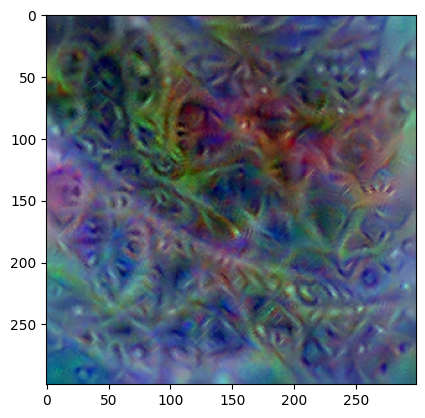

In [38]:
plt.imshow((before_blur * 255).astype(np.uint8))

## Jitter the weights a little bit to see if it affects the output?

## Synthetic examples

In [33]:
def rfft2d_freqs(h, w):
    """Computes 2D spectrum frequencies."""

    fy = np.fft.fftfreq(h)[:, None]
    # when we have an odd input dimension we need to keep one additional
    # frequency and later cut off 1 pixel
    if w % 2 == 1:
        fx = np.fft.fftfreq(w)[: w // 2 + 2]
    else:
        fx = np.fft.fftfreq(w)[: w // 2 + 1]
    return np.sqrt(fx * fx + fy * fy)


In [34]:
temp = rfft2d_freqs(224, 224)

In [35]:
temp.shape

(224, 113)